In [2]:
! git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15615, done.
remote: Counting objects: 100% (222/222), done.
remote: Compressing objects: 100% (163/163), done.
remote: Total 15615 (delta 106), reused 129 (delta 59), pack-reused 15393
Receiving objects: 100% (15615/15615), 14.59 MiB | 22.23 MiB/s, done.
Resolving deltas: 100% (10635/10635), done.


In [3]:
! pip install -qr yolov5/requirements.txt

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.12.2 requires cupy-cuda115, which is not installed.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-serving-api 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
librosa 0.10.0.post2 requires soundfile>=0.12.1, but you have soundfile 0.11.0 which is incompatible.
distributed 2021.11.2 requires dask==2021.11.2, but you have dask 2022.2.0 which is incompatible.
dask-cudf 21.12.2 requires dask<=2021.11.2,>=2021.11.1, but you have dask 2022.2.0 which is incompatible.
cloud-tpu-client 0.10 requires google-api-python-client==1.8.0, but you have

In [4]:
from yolov5 import utils
from IPython import display
from IPython.display import clear_output
from pathlib import Path
import yaml
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import io
import os
import cv2
import json
import shutil
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
import torchvision.models as models
from PIL import Image
from matplotlib.ticker import FormatStrFormatter

In [5]:
IMAGE_SIZE    = (1024, 768)
IMAGES_PATH = "/kaggle/input/stanford-cars-dataset/cars_train/cars_train/"
PROJECT_NAME = "yolov5_car_train"
BASE_MODEL = "yolov5m6.pt"
TRAIN_BATCH = 32
TRAIN_EPOCHS = 24
VAL_BATCH = 64

In [6]:
IMAGES_PATH

'/kaggle/input/stanford-cars-dataset/cars_train/cars_train/'

In [7]:
for dirname, _, filenames in os.walk('/kaggle/working/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/__notebook_source__.ipynb
/kaggle/working/yolov5/val.py
/kaggle/working/yolov5/LICENSE
/kaggle/working/yolov5/hubconf.py
/kaggle/working/yolov5/.dockerignore
/kaggle/working/yolov5/detect.py
/kaggle/working/yolov5/tutorial.ipynb
/kaggle/working/yolov5/CITATION.cff
/kaggle/working/yolov5/export.py
/kaggle/working/yolov5/CONTRIBUTING.md
/kaggle/working/yolov5/.pre-commit-config.yaml
/kaggle/working/yolov5/README.md
/kaggle/working/yolov5/requirements.txt
/kaggle/working/yolov5/setup.cfg
/kaggle/working/yolov5/.gitattributes
/kaggle/working/yolov5/benchmarks.py
/kaggle/working/yolov5/.gitignore
/kaggle/working/yolov5/train.py
/kaggle/working/yolov5/README.zh-CN.md
/kaggle/working/yolov5/models/tf.py
/kaggle/working/yolov5/models/__init__.py
/kaggle/working/yolov5/models/experimental.py
/kaggle/working/yolov5/models/yolov5l.yaml
/kaggle/working/yolov5/models/common.py
/kaggle/working/yolov5/models/yolo.py
/kaggle/working/yolov5/models/yolov5n.yaml
/kaggle/working/yolov5/mod

In [8]:
train_df = pd.read_csv("/kaggle/input/car-data-csv/StanfordCarsDatasetCSV-main/cardatasettrain.csv")

In [9]:
train_df

,Unnamed: 0,x1,y1,x2,y2,Class,image
0,0,39,116,569,375,14,00001.jpg
1,1,36,116,868,587,3,00002.jpg
2,2,85,109,601,381,91,00003.jpg
3,3,621,393,1484,1096,134,00004.jpg
4,4,14,36,133,99,106,00005.jpg
...,...,...,...,...,...,...,...
8139,8139,3,44,423,336,78,08140.jpg
8140,8140,138,150,706,523,196,08141.jpg
8141,8141,26,246,660,449,163,08142.jpg
8142,8142,78,526,1489,908,112,08143.jpg


In [10]:
def width(df):
    return int(df.x2 - df.x1)
def height(df):
    return int(df.y2 - df.y1)
def x_center(df):
    return int((df.x1 + df.x2)/2)
def y_center(df):
    return int((df.y1 + df.y2)/2)
def h_w_norm(df):
    for i in range(len(df)):
        image = cv2.imread(IMAGES_PATH+ "/" + df['image'][i])
        height, width, channels = image.shape
        df.loc[i,'x_center_norm'] = df['x_center'][i]/width
        df.loc[i,"y_center_norm"] = df['y_center'][i]/height
        df.loc[i,"width_norm"] = df['width'][i]/width
        df.loc[i,"height_norm"] = df['height'][i]/height
    return df
def h_norm(df):
    return df/IMAGE_SIZE[1]

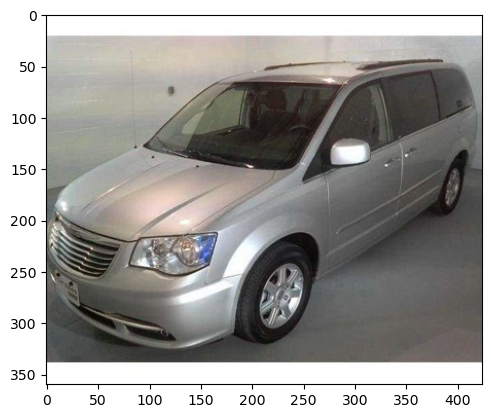

In [11]:
image = cv2.imread(IMAGES_PATH+ "/" + train_df['image'][8139])
plt.imshow(image)

In [12]:
train_df['width'] = train_df.apply(width, axis=1)
train_df['height'] = train_df.apply(height, axis=1)
train_df['x_center'] = train_df.apply(x_center, axis=1)
train_df['y_center'] = train_df.apply(y_center, axis=1)
train_df = h_w_norm(train_df)

In [13]:
train, test = train_test_split(train_df, test_size=0.15, shuffle=True)
valid, test = train_test_split(test, test_size=0.2)

In [14]:
train.shape

(6922, 15)

In [15]:
shutil.rmtree("test/images")
shutil.rmtree("test/labels")
shutil.rmtree("train/images")
shutil.rmtree("train/labels")
shutil.rmtree("valid/images")
shutil.rmtree("valid/labels")

FileNotFoundError: [Errno 2] No such file or directory: 'test/images'

In [16]:
os.makedirs("test/images")
os.makedirs("test/labels")
os.makedirs("train/images")
os.makedirs("train/labels")
os.makedirs("valid/images")
os.makedirs("valid/labels")

In [17]:
train_df["image"][1]

'00002.jpg'

In [18]:
train.keys()

Index(['Unnamed: 0', 'x1', 'y1', 'x2', 'y2', 'Class', 'image', 'width',
       'height', 'x_center', 'y_center', 'x_center_norm', 'y_center_norm',
       'width_norm', 'height_norm'],
      dtype='object')

In [19]:
def move_files_to_dir(df, dirname):
    for i in df.index.values.tolist():
        image_filename = f"{df['image'][i]}"
        print(image_filename + " Done")
        shutil.copy(f"{IMAGES_PATH}/{df['image'][i]}", f"{dirname}/images/{image_filename}")
        with open(f"{dirname}/labels/{df['image'][i][:-4]}.txt","w") as f:
            f.write(f"{0} {df['x_center_norm'][i]} {df['y_center_norm'][i]} {df['width_norm'][i]} {df['height_norm'][i]}")
            
move_files_to_dir(train, "train")
move_files_to_dir(test, "test")
move_files_to_dir(valid, "valid")
                  

01799.jpg Done
01787.jpg Done
05880.jpg Done
08035.jpg Done
01612.jpg Done
04526.jpg Done
05081.jpg Done
07691.jpg Done
07902.jpg Done
05153.jpg Done
01875.jpg Done
02834.jpg Done
02022.jpg Done
04570.jpg Done
00429.jpg Done
02954.jpg Done
02494.jpg Done
06763.jpg Done
00719.jpg Done
00080.jpg Done
02195.jpg Done
01168.jpg Done
06108.jpg Done
01574.jpg Done
02677.jpg Done
08106.jpg Done
06356.jpg Done
00082.jpg Done
06313.jpg Done
04732.jpg Done
04742.jpg Done
01564.jpg Done
04229.jpg Done
07236.jpg Done
02086.jpg Done
05037.jpg Done
07938.jpg Done
04032.jpg Done
01669.jpg Done
04030.jpg Done
07924.jpg Done
06398.jpg Done
04593.jpg Done
00748.jpg Done
02756.jpg Done
05189.jpg Done
00308.jpg Done
00249.jpg Done
06466.jpg Done
04777.jpg Done
07156.jpg Done
07754.jpg Done
04711.jpg Done
02619.jpg Done
04860.jpg Done
02446.jpg Done
04136.jpg Done
07280.jpg Done
05656.jpg Done
00583.jpg Done
02288.jpg Done
07903.jpg Done
05057.jpg Done
00613.jpg Done
07922.jpg Done
03345.jpg Done
03042.jpg 

In [20]:
train_path = "../train/images"
test_path = "../test/images"
valid_path = "../valid/images"

nc = 0
names = ["Car"]

print(
    f"train: {train_path}\n"
    f"test: {test_path}\n"
    f"val: {valid_path}\n\n"
    f"nc: {nc}\n"
    f"names: {names}",
)

train: ../train/images
test: ../test/images
val: ../valid/images

nc: 0
names: ['Car']


In [21]:
with open("data.yaml", "w") as file:
    yaml.dump({
        "train": train_path,
        "test": test_path,
        "val": valid_path,
        "nc": 0,
        "names": ["Car"]
    }, stream=file, default_flow_style=None)

In [22]:
wildcard = f"{PROJECT_NAME}/feature_extraction*"
! rm -r $wildcard

rm: cannot remove 'yolov5_car_train/feature_extraction*': No such file or directory


In [23]:
pip uninstall wandb --yes

Found existing installation: wandb 0.14.0
Uninstalling wandb-0.14.0:
  Successfully uninstalled wandb-0.14.0
Note: you may need to restart the kernel to use updated packages.


In [24]:
! python yolov5/train.py --batch $TRAIN_BATCH --epochs 5 --data "data.yaml" --weights $BASE_MODEL --project $PROJECT_NAME --name 'feature_extraction' --cache --freeze 12

train: weights=yolov5m6.pt, cfg=, data=data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5_car_train, name=feature_extraction, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /kaggle/working/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls

In [25]:
wildcard = f"{PROJECT_NAME}/validation_on_test_data*"
! rm -r $wildcard

rm: cannot remove 'yolov5_car_train/validation_on_test_data*': No such file or directory


In [26]:
WEIGHTS_BEST = f"{PROJECT_NAME}/feature_extraction/weights/best.pt"
! python yolov5/val.py --weights $WEIGHTS_BEST --batch $VAL_BATCH --data 'data.yaml' --task test --project $PROJECT_NAME --name 'validation_on_test_data' --augment

val: data=data.yaml, weights=['yolov5_car_train/feature_extraction/weights/best.pt'], batch_size=64, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5_car_train, name=validation_on_test_data, exist_ok=False, half=False, dnn=False
requirements: /kaggle/working/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
test: Scanning /kaggle/working/test/labels... 245 images, 0 backgrounds, 0 corru
test: New cache created: /kaggle/working/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   
                   all        245        245          1          1      0.995      0.909
Speed: 1.8ms pre-process, 19.8ms 

In [27]:
wildcard = f"{PROJECT_NAME}/detect_test*"
! rm -r $wildcard

rm: cannot remove 'yolov5_car_train/detect_test*': No such file or directory


In [28]:
! python yolov5/detect.py --weights $WEIGHTS_BEST --conf 0.6 --source 'test/images' --project $PROJECT_NAME --name 'detect_test' --augment --line=3

detect: weights=['yolov5_car_train/feature_extraction/weights/best.pt'], source=test/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=yolov5_car_train, name=detect_test, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /kaggle/working/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
image 1/245 /kaggle/working/test/images/00025.jpg: 512x640 1 Car, 104.7ms
image 2/245 /kaggle/working/test/images/00052.jpg: 384x640 1 Car, 94.1ms
image 3/245 /kaggle/working/test/images/00067.jpg: 512x640 1 Car, 92.9ms
image 4/245 /kag

In [29]:
def read_images(dirpath):
    images = {}
    for img_filename in os.listdir(dirpath):
        images[img_filename] = cv2.imread(f"{dirpath}/{img_filename}")
    return images

In [30]:
detect_path = f"{PROJECT_NAME}/detect_test"
test_images_path = f"test/images"
test_labels_path = f"test/labels"


In [120]:
def display_image(img,class_name, bbox_coords=[], pred_img=None, norm=False,title="Car"):
    # if the image has been normalized, scale it up
    if norm:
        img *= 255.
        img = img.astype(np.uint8)
    
    # Draw the bounding boxes
    if len(bbox_coords) == 4:
        xmin, ymin, xmax, ymax = bbox_coords
        img = cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 3)
              
    #cv2.putText(img, str(class_name), (xmin+30, ymin+30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255, 0), 3)    
    plt.figure(figsize=(40, 15))
    f, axarr = plt.subplots(1,2,figsize=(15, 15))
    
    axarr[0].imshow(img)
    axarr[1].imshow(pred_img)
    f.suptitle("Class is"+title)
    plt.xticks([])
    plt.yticks([])
    
def display_image_from_file(name,class_name, bbox_coords=[], path=IMAGES_PATH,pred_img=None,title="Car"):
    img = cv2.imread(f"{path}/{name}")
    print(f"{path}/{name}")
    display_image(img,class_name-1, bbox_coords=bbox_coords,pred_img=pred_img,title=title)
    
def display_from_dataframe(row, path=IMAGES_PATH,pred_img=None,title="Car"):
    display_image_from_file(row['image'],row["Class"], bbox_coords=(row.x1, row.y1, row.x2, row.y2), path=path,pred_img=pred_img,title=title)
    

def display_grid(df=train_df, n_items=3):
    plt.figure(figsize=(20, 10))
    
    # get 3 random entries and plot them in a 1x3 grid
    rand_indices = [np.random.randint(0, df.shape[0]) for _ in range(n_items)]
    
    for pos, index in enumerate(rand_indices):
        plt.subplot(1, n_items, pos + 1)
        display_from_dataframe(df.loc[index, :])



In [32]:
pred_images = read_images(detect_path)


In [33]:
test_path="/kaggle/working/test/images"
def display_pred_test(df,n_items=3):
    rand_indices = [np.random.randint(0, df.shape[0]) for _ in range(n_items)]
    for pos, index in enumerate(rand_indices):
        img = pred_images[df.iloc[index,:]["image"]]

        display_from_dataframe(df.iloc[index, :],path=test_path,pred_img=img)


<Figure size 4000x1500 with 0 Axes>

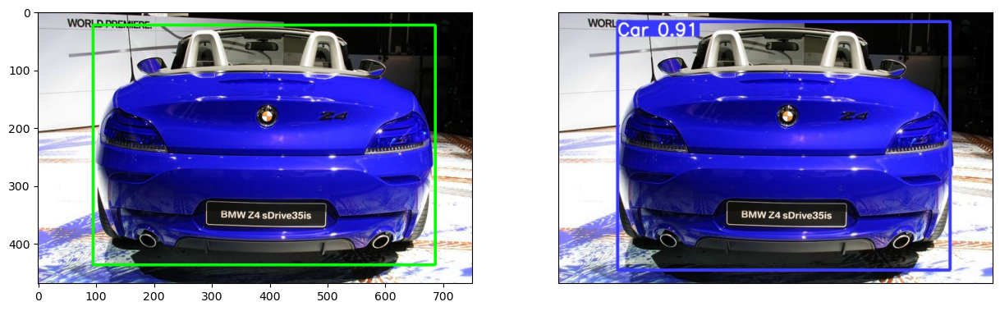

<Figure size 4000x1500 with 0 Axes>

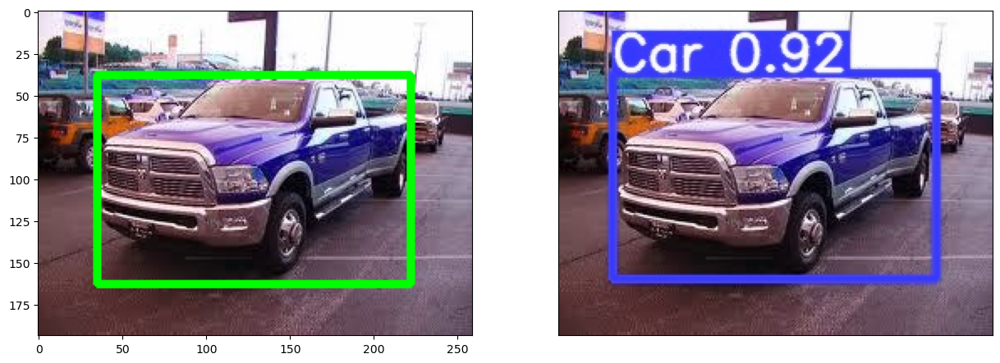

<Figure size 4000x1500 with 0 Axes>

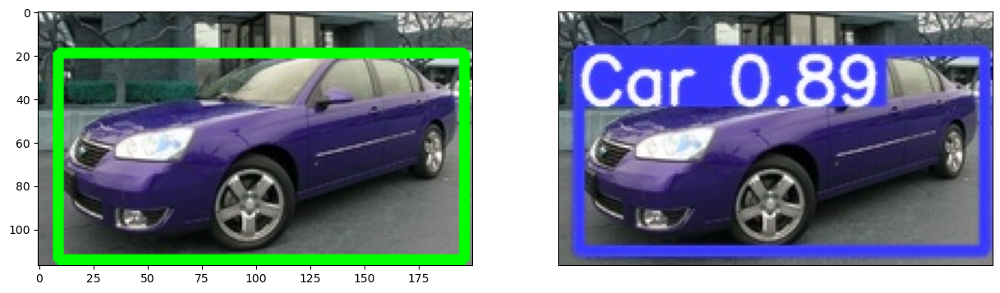

<Figure size 4000x1500 with 0 Axes>

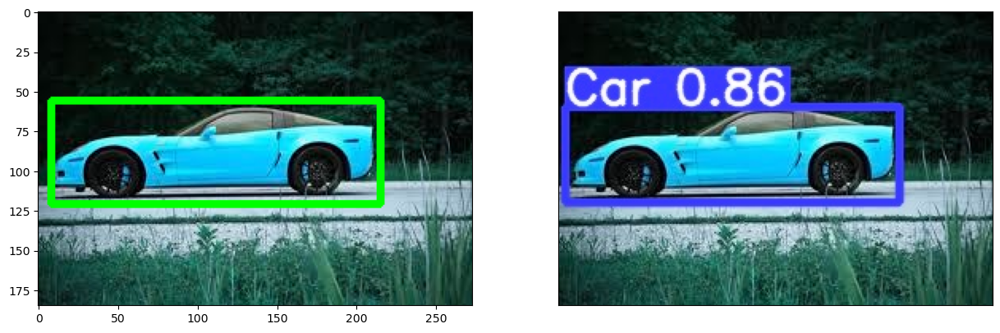

<Figure size 4000x1500 with 0 Axes>

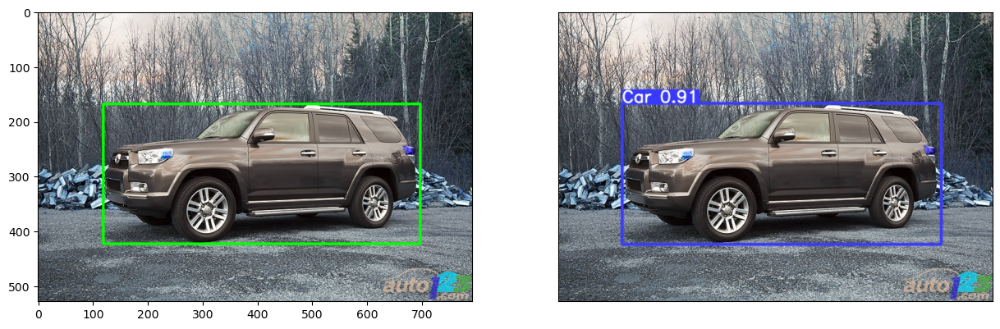

In [34]:
display_pred_test(test,1)

In [63]:
data_dir = "/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data"
train_dir = data_dir + '/train'
valid_dir = data_dir + '/valid'
test_dir = data_dir + '/test'

In [36]:
train_transforms = transforms.Compose([transforms.Resize((244,244)),
                                       transforms.RandomRotation(30),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor(),
                                       transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])


# The validation set will use the same transform as the test set
test_transforms = transforms.Compose([transforms.Resize((244,244)),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

validation_transforms = transforms.Compose([transforms.Resize((244,244)),
                                            transforms.CenterCrop(224),
                                            transforms.ToTensor(),
                                            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [51]:
train_data = datasets.ImageFolder(data_dir + '/train', transform=train_transforms)
test_data = datasets.ImageFolder(data_dir + '/test', transform=test_transforms)
#valid_data = datasets.ImageFolder(data_dir + '/valid', transform=validation_transforms)

In [38]:
train_data, valid_data = torch.utils.data.random_split(train_data, [0.7, 0.3])

In [39]:
trainloader = torch.utils.data.DataLoader(train_data, batch_size=128, shuffle=True)
testloader = torch.utils.data.DataLoader(test_data, batch_size=32, shuffle=True)
validloader = torch.utils.data.DataLoader(valid_data, batch_size=32, shuffle=True)

In [40]:
model = models.resnet34(pretrained=True)

/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [41]:
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 196)

In [42]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
lrscheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, threshold = 0.9)

In [43]:
def validation(model, validloader, criterion):
    valid_loss = 0
    accuracy = 0
    
    # change model to work with cuda
    model.to('cuda')

    # Iterate over data from validloader
    for ii, (images, labels) in enumerate(validloader):
    
        # Change images and labels to work with cuda
        images, labels = images.to('cuda'), labels.to('cuda')

        # Forward pass image though model for prediction
        output = model.forward(images)
        # Calculate loss
        valid_loss += criterion(output, labels).item()
        # Calculate probability
        ps = torch.exp(output)
        
        # Calculate accuracy
        equality = (labels.data == ps.max(dim=1)[1])
        accuracy += equality.type(torch.FloatTensor).mean()
    
    return valid_loss, accuracy

In [44]:
device = torch.device("cuda")
model = model.to(device)

In [47]:
epochs = 10
steps = 0
print_every = 40

# change to gpu mode
model.to('cuda')
model.train()
for e in range(epochs):

    running_loss = 0
    
    # Iterating over data to carry out training step
    for ii, (inputs, labels) in enumerate(trainloader):
        steps += 1
        
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        
        # zeroing parameter gradients
        optimizer.zero_grad()
        
        # Forward and backward passes
        outputs = model.forward(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Carrying out validation step
        if steps % print_every == 0:
            # setting model to evaluation mode during validation
            model.eval()
            
            # Gradients are turned off as no longer in training
            with torch.no_grad():
                valid_loss, accuracy = validation(model, validloader, criterion)
            
            print(f"No. epochs: {e+1}, \
            Training Loss: {round(running_loss/print_every,3)} \
            Valid Loss: {round(valid_loss/len(validloader),3)} \
            Valid Accuracy: {round(float(accuracy/len(validloader)),3)}")
            
            
            # Turning training back on
            model.train()
            lrscheduler.step(accuracy * 100)
           

No. epochs: 1,             Training Loss: 4.028             Valid Loss: 3.616             Valid Accuracy: 0.202
No. epochs: 2,             Training Loss: 2.488             Valid Loss: 2.823             Valid Accuracy: 0.336
No. epochs: 3,             Training Loss: 1.467             Valid Loss: 2.331             Valid Accuracy: 0.426
No. epochs: 4,             Training Loss: 0.832             Valid Loss: 1.916             Valid Accuracy: 0.528
No. epochs: 5,             Training Loss: 0.471             Valid Loss: 1.721             Valid Accuracy: 0.575
No. epochs: 6,             Training Loss: 0.226             Valid Loss: 1.484             Valid Accuracy: 0.615
No. epochs: 7,             Training Loss: 0.117             Valid Loss: 1.383             Valid Accuracy: 0.639
No. epochs: 8,             Training Loss: 0.043             Valid Loss: 1.091             Valid Accuracy: 0.723
No. epochs: 8,             Training Loss: 0.37             Valid Loss: 1.074             Valid Accuracy:

In [49]:
correct = 0
total = 0
model.to('cuda')


with torch.no_grad():
    for data in testloader:
        images, labels = data
        images, labels = images.to('cuda'), labels.to('cuda')
        # Get probabilities
        outputs = model(images)
        # Turn probabilities into predictions
        _, predicted_outcome = torch.max(outputs.data, 1)
        # Total number of images
        total += labels.size(0)
        # Count number of cases in which predictions are correct
        correct += (predicted_outcome == labels).sum().item()

print(f"Test accuracy of model: {round(100 * correct / total,3)}%")

Test accuracy of model: 71.222%


In [52]:
checkpoint = {'state_dict': model.state_dict(),
              'model': model.fc,
              'class_to_idx': train_data.class_to_idx,
              'opt_state': optimizer.state_dict,
              'num_epochs': epochs}

torch.save(checkpoint, '/kaggle/working/my_checkpoint1.pth')

In [53]:
def load_checkpoint(filepath):

    checkpoint = torch.load(filepath)
    
    #model.load_state_dict(checkpoint['state_dict'])
    model.load_state_dict(checkpoint['state_dict'], strict=False)
    model.class_to_idx = checkpoint['class_to_idx']
    
    return model

In [54]:
model_path= "/kaggle/working/my_checkpoint1.pth"
model = load_checkpoint('/kaggle/working/my_checkpoint1.pth')
# Checking model i.e. should have 196 output units in the classifier
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [76]:

def process_image(image):
    
    # Process a PIL image for use in a PyTorch model

    # Converting image to PIL image using image file path
    pil_im = Image.open(f'{image}')

    # Building image transform
    transform = transforms.Compose([transforms.Resize((244,244)),
                                    #transforms.CenterCrop(224),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.485, 0.456, 0.406], 
                                                         [0.229, 0.224, 0.225])]) 
    
    # Transforming image for use with network
    pil_tfd = transform(pil_im)
    
    # Converting to Numpy array 
    array_im_tfd = np.array(pil_tfd)
    
    return array_im_tfd

In [77]:
def imshow(image, ax=None, title=None):
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    image = image.transpose((1, 2, 0))
    
    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    
    # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)
    
    ax.imshow(image)
    
    return ax
     

In [78]:
def predict(image_path, model, topk=5):
    # Implement the code to predict the class from an image file   
    
    # Loading model - using .cpu() for working with CPUs
    loaded_model = load_checkpoint(model).cpu()
    # Pre-processing image
    img = process_image(image_path)
    # Converting to torch tensor from Numpy array
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    # Adding dimension to image to comply with (B x C x W x H) input of model
    img_add_dim = img_tensor.unsqueeze_(0)

    # Setting model to evaluation mode and turning off gradients
    loaded_model.eval()
    with torch.no_grad():
        # Running image through network
        output = loaded_model.forward(img_add_dim)
        
    #conf, predicted = torch.max(output.data, 1)   
    probs_top = output.topk(topk)[0]
    predicted_top = output.topk(topk)[1]
    
    # Converting probabilities and outputs to lists
    conf = np.array(probs_top)[0]
    predicted = np.array(predicted_top)[0]
        
    #return probs_top_list, index_top_list
    return conf, predicted

In [58]:
def find_classes(dir):
    classes = os.listdir(dir)
    classes.sort()
    class_to_idx = {classes[i]: i for i in range(len(classes))}
    return classes, class_to_idx
classes, c_to_idx = find_classes(data_dir+"/train")

print(classes, c_to_idx)

['AM General Hummer SUV 2000', 'Acura Integra Type R 2001', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008', 'Acura TSX Sedan 2012', 'Acura ZDX Hatchback 2012', 'Aston Martin V8 Vantage Convertible 2012', 'Aston Martin V8 Vantage Coupe 2012', 'Aston Martin Virage Convertible 2012', 'Aston Martin Virage Coupe 2012', 'Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 'Audi A5 Coupe 2012', 'Audi R8 Coupe 2012', 'Audi RS 4 Convertible 2008', 'Audi S4 Sedan 2007', 'Audi S4 Sedan 2012', 'Audi S5 Convertible 2012', 'Audi S5 Coupe 2012', 'Audi S6 Sedan 2011', 'Audi TT Hatchback 2011', 'Audi TT RS Coupe 2012', 'Audi TTS Coupe 2012', 'Audi V8 Sedan 1994', 'BMW 1 Series Convertible 2012', 'BMW 1 Series Coupe 2012', 'BMW 3 Series Sedan 2012', 'BMW 3 Series Wagon 2012', 'BMW 6 Series Convertible 2007', 'BMW ActiveHybrid 5 Sedan 2012', 'BMW M3 Coupe 2012', 'BMW M5 Sedan 2010', 'BMW M6 Convertible 2010', 'BMW X3 SUV 2012', 'BMW X5 SUV 2007', 'BMW X6 SUV 2012', 'BMW Z4 Convertible 2012

In [80]:
image_path = data_dir + '/test/Acura Integra Type R 2001/00128'


conf1, predicted1 = predict(image_path, model_path, topk=5)

print(conf1)
print(classes[predicted1[0]])

[4.743084  3.4856057 3.36705   2.7071426 2.5304174]
Acura Integra Type R 2001


In [113]:
test[test["image"]==cardir].iloc[0,:]["image"]

'02129.jpg'

In [143]:
def plot_solution(cardir, model):
  # Testing predict function

  # Inputs are paths to saved model and test image
    image_path = f"{test_path}/{cardir}"

    conf2, predicted1 = predict(image_path, model_path, topk=5)
    # Converting classes to names
    names = []
    for i in range(5):

        names += [classes[predicted1[i]]]

    img = pred_images[cardir]
    
    display_from_dataframe(test[test["image"]==cardir].iloc[0,:],path=test_path,pred_img=img,title=names[0])
    # Creating PIL image
    image = cv2.imread(image_path)

    # Plotting test image and predicted probabilites
    f, ax = plt.subplots(1,figsize = (3,3))

    
    y_names = np.arange(len(names))
    ax.barh(y_names, conf2/conf2.sum(), color='darkblue')
    ax.set_yticks(y_names)
    ax.set_yticklabels(names)
    ax.invert_yaxis() 

    plt.show()

/kaggle/working/test/images/02129.jpg


<Figure size 4000x1500 with 0 Axes>

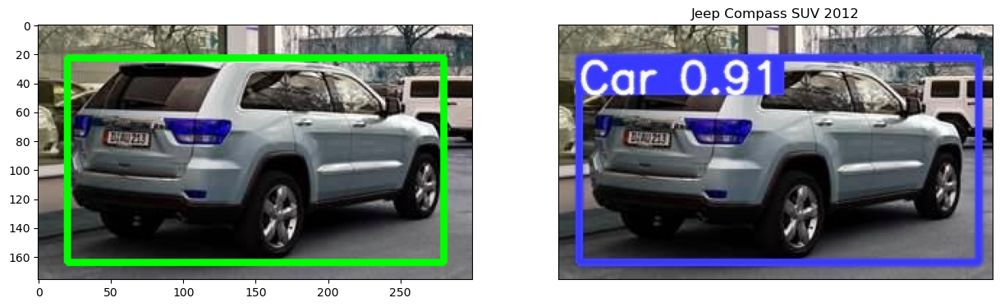

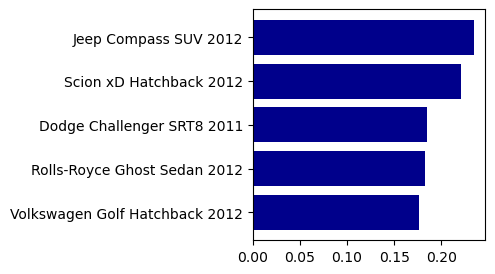

In [144]:
cardir='02129.jpg'
plot_solution(cardir, model)

In [145]:
test_path="/kaggle/working/test/images"
def display_pred_test_with_class(df,n_items=3):
    rand_indices = [np.random.randint(0, df.shape[0]) for _ in range(n_items)]
    for pos, index in enumerate(rand_indices):
        plot_solution(df.iloc[index,:]["image"],model)


/kaggle/working/test/images/04041.jpg


<Figure size 4000x1500 with 0 Axes>

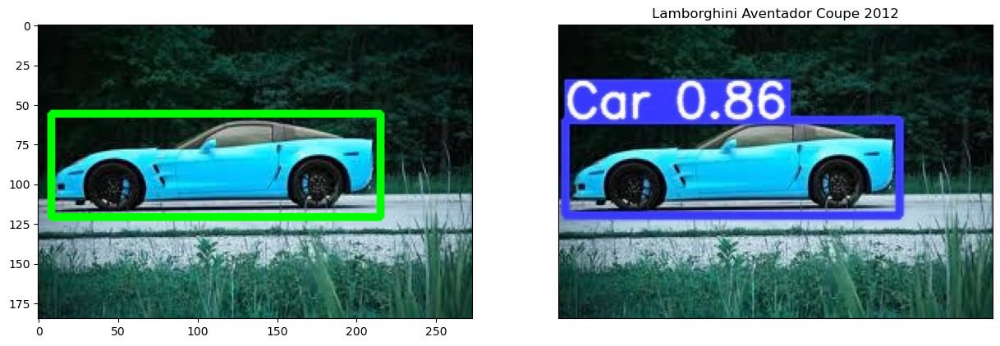

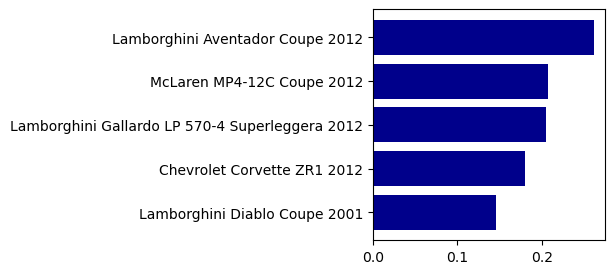

/kaggle/working/test/images/06423.jpg


<Figure size 4000x1500 with 0 Axes>

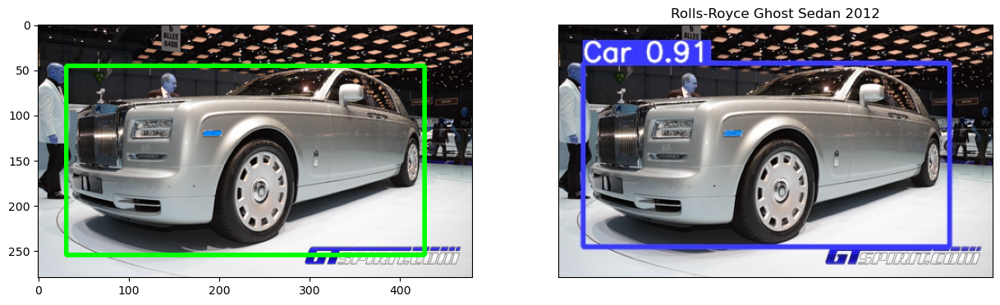

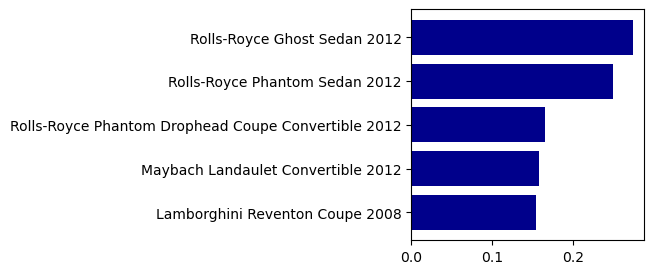

/kaggle/working/test/images/03993.jpg


<Figure size 4000x1500 with 0 Axes>

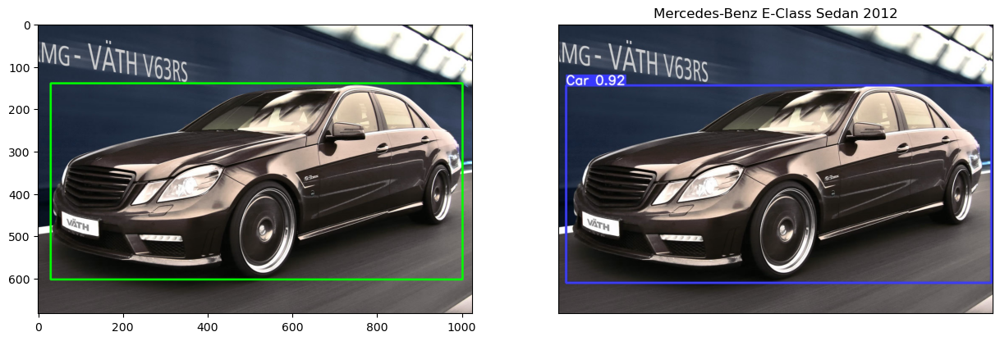

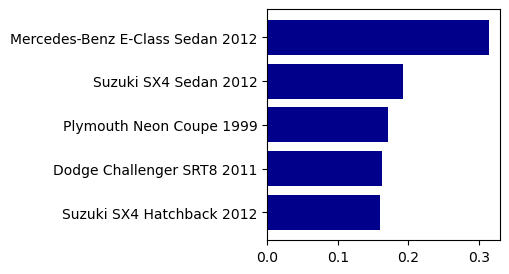

/kaggle/working/test/images/06400.jpg


<Figure size 4000x1500 with 0 Axes>

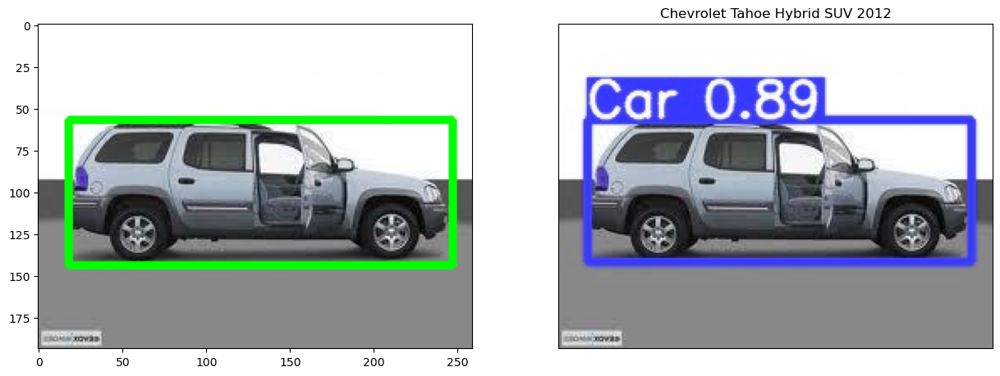

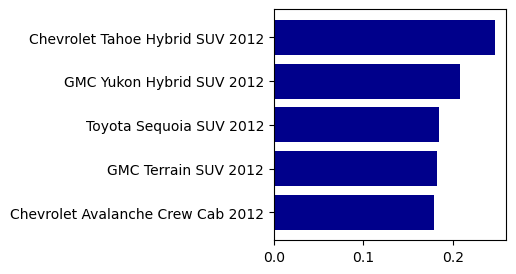

/kaggle/working/test/images/02000.jpg


<Figure size 4000x1500 with 0 Axes>

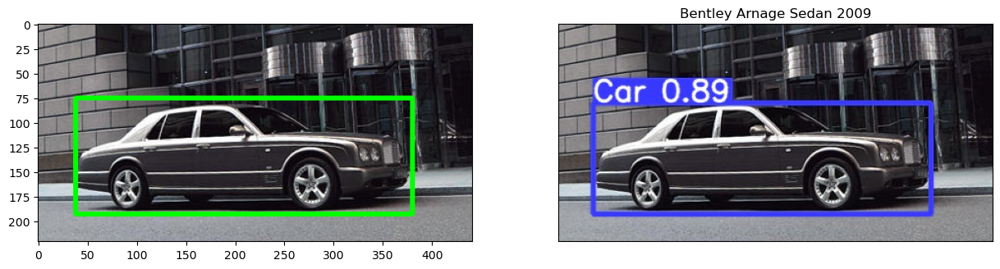

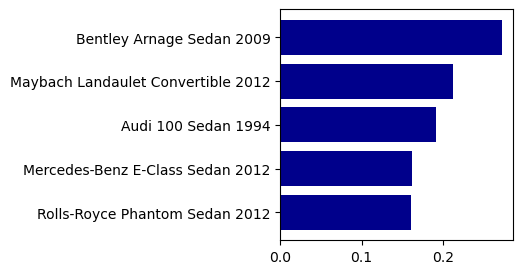

/kaggle/working/test/images/04041.jpg


<Figure size 4000x1500 with 0 Axes>

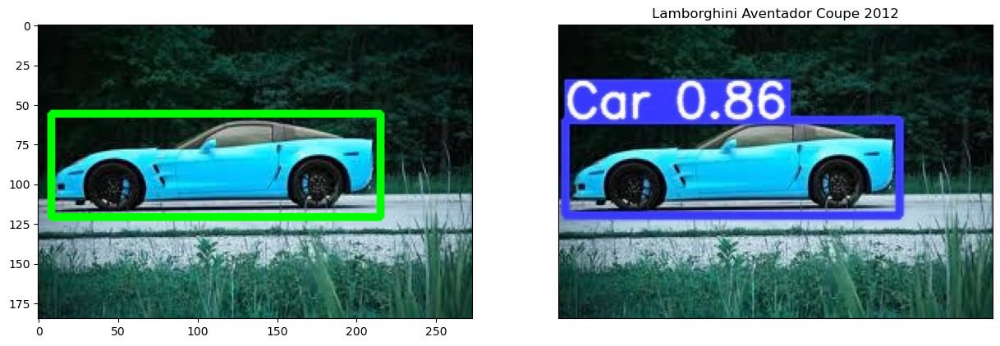

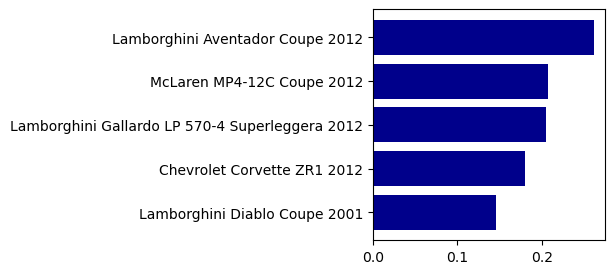

/kaggle/working/test/images/03542.jpg


<Figure size 4000x1500 with 0 Axes>

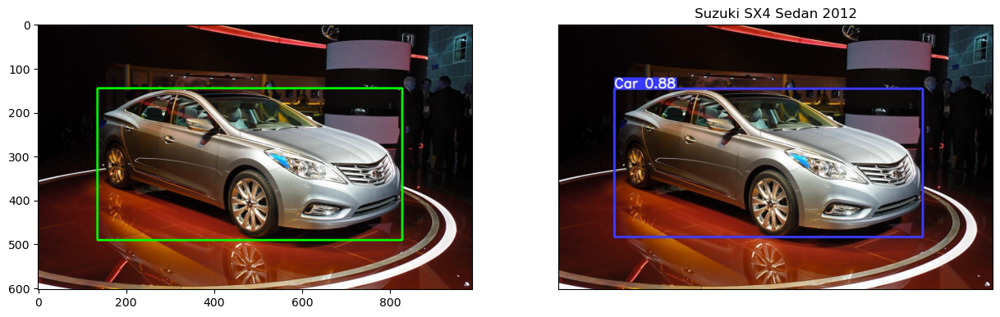

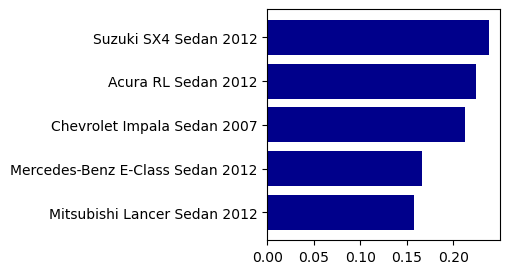

/kaggle/working/test/images/03093.jpg


<Figure size 4000x1500 with 0 Axes>

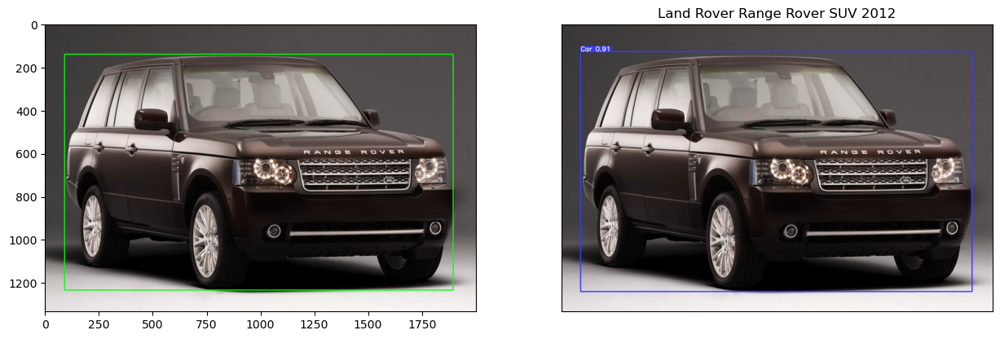

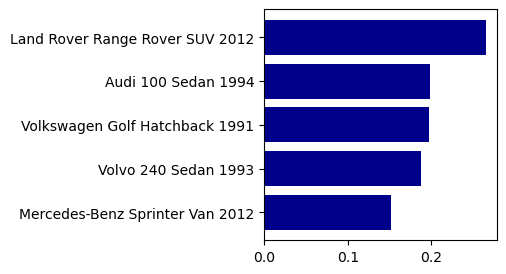

/kaggle/working/test/images/00800.jpg


<Figure size 4000x1500 with 0 Axes>

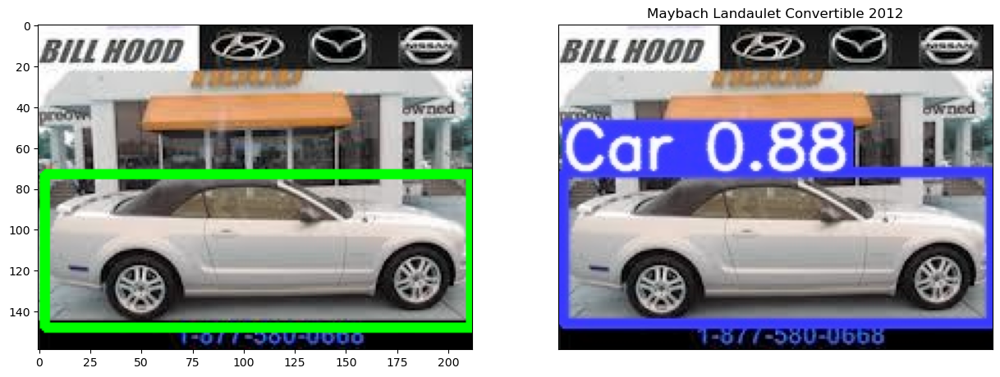

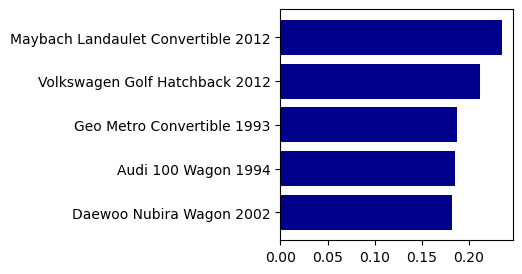

/kaggle/working/test/images/02431.jpg


<Figure size 4000x1500 with 0 Axes>

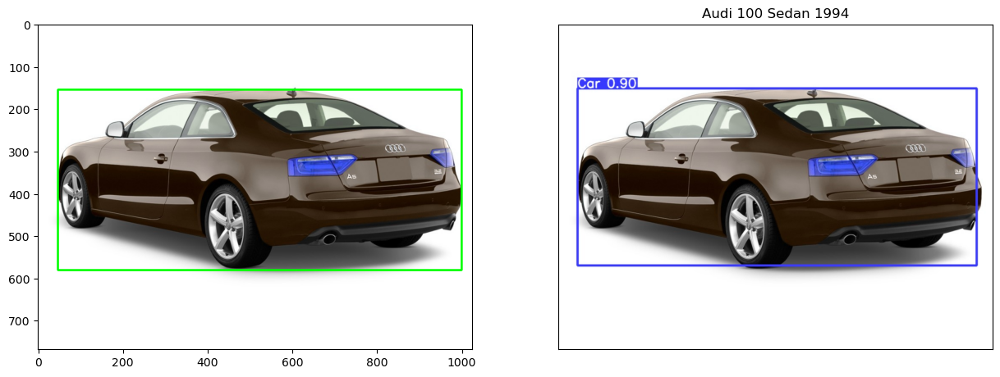

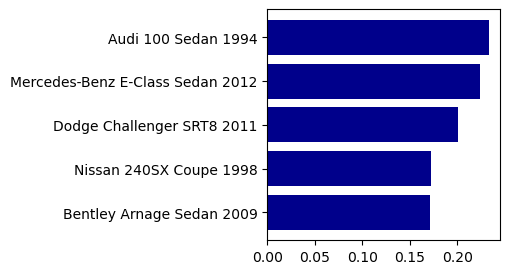

In [146]:
display_pred_test_with_class(test,10)